# End-to-end Multiclass Dog Breed Classificaton


This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## Data
The data i am using is from kaggle
https://www.kaggle.com/competitions/dog-breed-identification/data?select=test

## 3. Evaluation
The evaluation is a file wth prediction probability for each dog breed of each test image

## 4. Features
Some information about the data:
* Dealing with images (unstructured data) best use deep larning/ transfer learning.
* There are 120 breeds of dogs (this means 120 differnt classification)
* There are around 10,000+ images in the training set.(these images have lables)
* There are about 10,000+ images in test set.(images have no lables)

In [ ]:
# Unzip the imported data into tensorflow
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready

* Import TesorFlow 2.x
* Import TensorFlow Hub
* Make sure I'm using a GPU

In [ ]:

# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF version", hub.__version__)

# Check for GPU availbility
print("GPU", "available (Yessss!!)" if tf.config.list_physical_devices("GPU") else "not available ;(")

TF version 2.13.0
TF version 0.14.0
GPU available (Yessss!!)


## Getting our data ready (turning into Tensors)
With all machine learnong models, our data has to be in numerical format. Turning the images into Tensors (numerical representations).


Let's strat be accessing ur data and checking out the label.



In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

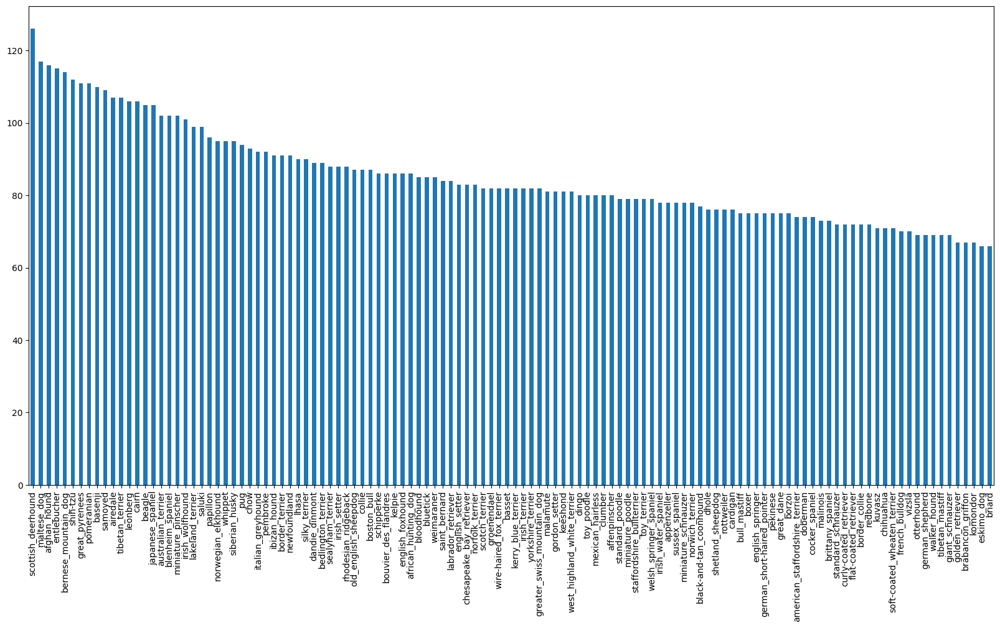

In [ ]:
# How many images are there for each breed
labels_csv['breed'].value_counts().plot.bar(figsize = (20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

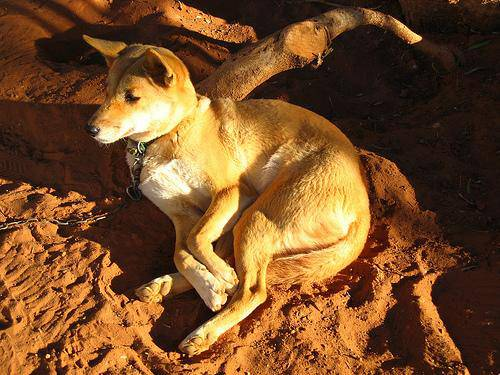

In [ ]:
# Viewng an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

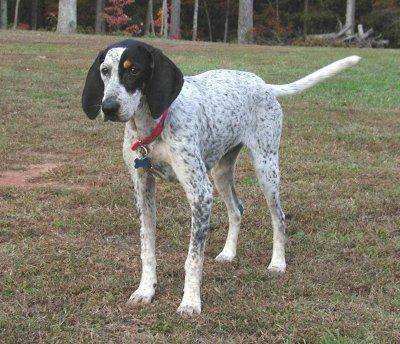

In [ ]:
Image("drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels
Le's get a list of all our image file pathnames

In [ ]:
# Create pathnames from image ID's
filenames = ['drive/My Drive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
os.listdir("drive/My Drive/Dog Vision/train/")[:10]

['e0f559dd162599f6bd888d53626d3c6d.jpg',
 'e0764f7b42ad2336c96d414b419af335.jpg',
 'e2b2636c291ebf5649ba403b9592f51e.jpg',
 'e1c77280c29861d14cd2c891ff8a362a.jpg',
 'ddde7d44c5c478092358387baee20cfb.jpg',
 'db7d4420a51a8928e82bcb1d9a6c4167.jpg',
 'e6898f5cc43bb4a30970f2d2210fdb9a.jpg',
 'dccc38e7901939c3181a71da57105c46.jpg',
 'e80dbb78fb1d763d01d73b2f367c6805.jpg',
 'e08af1f586d3150e4cecb3c42668b0e0.jpg']

In [ ]:
len(filenames)

10222

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount")
else:
  print("FIle name do not match the actual amount of files..")

Filenames match actual amount


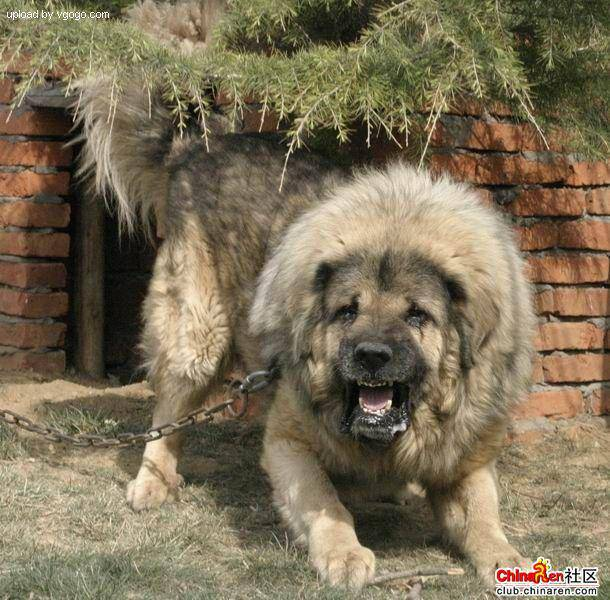

In [ ]:
Image(filenames[9000])

Preparing the labels

In [ ]:
import numpy as np
labels = labels_csv['breed']
# labels = labels_csv['breed'].to_numpy()
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Yes: Labels mathches filenames")
else:
  print("No: Number of labels does not match file names")


Yes: Labels mathches filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
from tensorflow.python.ops.gen_array_ops import unique
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle does not come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(boolean_labels)

10222

We're going to start off expermineting with 1000 images and increase as needed

In [ ]:
# Set number of images to use for expermenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
np.random.seed(42)
from sklearn.model_selection import train_test_split

# Split them into training and validation of toltal size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[: NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state =42)
len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into tensors)
To preprocess images to Tensors we're going to write a funtion whid[ch does a few things
1. Take an image filepath as input.
2. Use TensoreFlow to read the file and save it to a variable, 'image'
3. Turn our 'image'(a jpg) into Tensors
4. Resize the 'image' to ba a shape of (224, 224)
5. Return the modified 'image'

In [ ]:
tf.constant(image)[:2] # tf.constant concerts the image to a tensor


NameError: ignored

In [ ]:
image[:2]

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # Note thah imread reads the image from it's file path and turns it to an array
image.shape #(height, width, colour channel(RBG sample))

(257, 350, 3)

Now we have seen what an image looks like in a tensor,let's make a function to preprocess them
1. Take an image filepath as input.
2. Use TensoreFlow to read the file and save it to a variable, 'image'
3. Turn our 'image'(a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-225 to 0-1)
5. Resize the 'image' to ba a shape of (224, 224)
6. Return the modified 'image'

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image (image_path, img_size= IMG_SIZE):
  '''
  Takes an image path and turns the image into a Tensor.

  '''
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Rezize the image to our desired value (224, 224)
  image = tf.image.resize(image,size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images ione go.. they all might not fit into memory

Thaat's why we do 32 images at a time (you can manually adjust if need be).

In orde to use TensorFlow effectively, we need our data in form of Tensor tupples which look like this: ('image', 'label').

In [ ]:
## Create a simple funcition to return a tuple (image, label)

def get_image_label (image_path, label):
  '''
  Takes an image file path name and the associated label,
  prosesses the image and returns a tuple of (image, label)

  '''

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: '(image, label)', let's make a function to turn all of our dat ('X' &'y') into batches.

In [ ]:
# Define the batch size, 32
BATCH_SIZE = 32

# Creat a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Creates batches of data out of image (X) and label (y) pairs
  Shuffles the data if it's training data but doen't shuffle if it's validation data.
  Also accepts test data as input (no labels)

  '''
  # If the data is a test dataset, there are no labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we do not need to shuffle if
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:    #training data
    print("Creating training data batches.....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # Shufflling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create train and validation daa batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val,y_val)

Creating training data batches.....
Creating training data batches.....


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulaizing data
Data is now in batches, however these can be a little hard to understand/comprehend, let's visualize

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize = (10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 colums)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [ ]:
train_images, train_lables = next(train_data.as_numpy_iterator())
train_images, train_lables

(array([[[[7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          ...,
          [9.80392218e-01, 9.96078491e-01, 9.92156923e-01],
          [9.80392218e-01, 1.00000000e+00, 9.96078491e-01],
          [9.80392218e-01, 1.00000000e+00, 9.96078491e-01]],
 
         [[7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          ...,
          [9.80392218e-01, 9.96078491e-01, 9.92156923e-01],
          [9.80392218e-01, 1.00000000e+00, 9.96078491e-01],
          [9.80392218e-01, 1.00000000e+00, 9.96078491e-01]],
 
         [[7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          [7.84313798e-01, 7.25490212e-01, 6.11764729e-01],
          ...,
          [9.80392218e-01, 9.96078491e-01, 9.9215

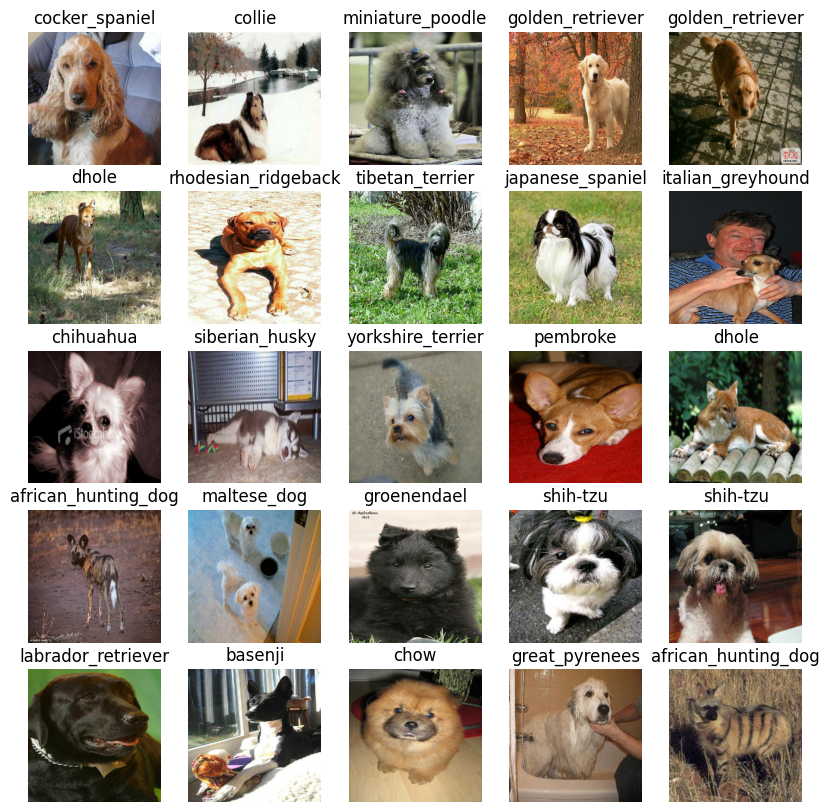

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_lables)

In [ ]:
# Noe let's visualize our validation set
val_images, val_labels = next(val.data.as_numpy_iterator)
show_25_images(val_images, val_labels)

NameError: ignored

## Building a model
Before we build a model, there are a few things we need to define
* The input shape (our images shape, in form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from tensorflow-hub "https://tfhub.dev/"

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the mode
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup mdel url from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs, and model ready to go let's put them together into Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Define the layers in a keras model in sequential fashion
(do this first, thenthis, then that).
* Compiles the model (saysa it should be evaluated and improves).
* Build the model (tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be found "https://www.tensorflow.org/guide/keras"

In [ ]:
# Create a funtion which build a keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([
                              hub.KerasLayer(MODEL_URL), #Layer 1, (input layer),
                              tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                                    activation = "softmax")  #Layer 2 (output layer) #if working with binary classifiaction activation= Sigmoid
  ])

  #Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),#if working with binary loss =BinaryCrossentropy()
      optimizer=tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


Creating callbacks
Callbacks are helper functions a model can use during trainng to do such things as sava its progress, check its progress or stop training early if a model stops imrpoving.

We'll create two callback
1. for TensorBoard which helps track our model progress and,
2. for early stopping which prvents our model from training for too long.

## Tensor boardcallback
To setup a tensorboard call back, we need to do 3 things,
1. Load the tensoboad notbook extension
2. Creata a TensorBoard callbach whch is able to save logs to a directory and pass it to our model's fit() funtion.
3. Visualize our models training logs withe the %tensorboard magic function (we'll do this after model training).

In [ ]:
# Load Tensorboard notbook extension
%load_ext tensorboard



In [ ]:
import datetime

def create_tensorboad_callback():
  # Craete a function to build a Tensorboard call dack
  logdir = os.path.join("/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S") )
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback
Early stopping helps stop our model from overfitting bu stopping training if a certain evaluation metrics stop improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience =3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure you're still running on a GPU
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

from ast import Return
Let's craet a function which traiins a model

* Create a model using 'create_model()'
* Setup a Tensorboard callback using 'create_tensorboard_callback()'
* Call the fit() function on our model passing it the training data, validation data,
number of epochs to train for (NUM_EPOCHS) and the call backs we'd like to use
* Return the model


In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given modek and returns the trained version
  """
  # Create a model
  model = create_model()

  # Craete new TensorBoard session evertime we train a model
  tensorboard = create_tensorboad_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model


In [ ]:
# Fir the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 177s 6s/step - loss: 4.5703 - accuracy: 0.0988 - val_loss: 3.4468 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 147ms/step - loss: 1.6561 - accuracy: 0.6750 - val_loss: 2.1899 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 120ms/step - loss: 0.5611 - accuracy: 0.9413 - val_loss: 1.6918 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2484 - accuracy: 0.9887 - val_loss: 1.5228 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 169ms/step - loss: 0.1441 - accuracy: 0.9987 - val_loss: 1.4357 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.3968 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================]

### Checking the tensor board logs

The tensorboard magic function ('% tensorboard') will access the logs directory we created ealier and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make prediction on the validation data {not used in training}
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 88ms/step


array([[1.6559918e-04, 6.5753184e-04, 2.0942541e-06, ..., 1.0091138e-05,
        2.2524438e-05, 8.2107971e-04],
       [9.8532776e-04, 2.9293259e-04, 1.3526342e-02, ..., 3.6157502e-03,
        1.2312463e-03, 3.3528448e-04],
       [2.8586552e-05, 4.1255302e-05, 2.0757292e-05, ..., 3.8252963e-04,
        1.3436622e-02, 1.3478764e-04],
       ...,
       [7.4790936e-05, 6.3280473e-03, 4.1009067e-04, ..., 4.7721555e-03,
        4.1751095e-04, 4.0467107e-03],
       [1.4096999e-03, 2.4262788e-05, 4.0030780e-05, ..., 9.7905388e-05,
        6.3470521e-05, 1.6022745e-03],
       [5.9647034e-03, 4.0218251e-06, 9.7405988e-05, ..., 4.5704437e-04,
        1.2324679e-04, 2.8082719e-03]], dtype=float32)

In [ ]:

predictions[0]
##These are the probablilites of a certain shaoe being a unique breed

array([1.65599180e-04, 6.57531840e-04, 2.09425411e-06, 1.26031255e-05,
       7.46717196e-05, 1.55086949e-04, 2.28303892e-04, 3.67057568e-04,
       3.62218078e-03, 1.61906617e-04, 4.77567337e-05, 1.02331741e-02,
       1.18774833e-05, 3.50886047e-01, 6.35719771e-05, 2.39108958e-05,
       1.39420968e-04, 1.12938351e-05, 1.78456001e-04, 1.44052989e-04,
       3.38902464e-05, 9.34699783e-05, 3.15393777e-06, 7.08549633e-05,
       6.72195898e-03, 1.24957063e-04, 2.14681604e-05, 1.66474812e-04,
       7.25022892e-06, 1.88770173e-05, 5.23026301e-06, 6.32001553e-04,
       3.06610614e-02, 7.78277230e-04, 2.17230026e-05, 1.20717596e-04,
       1.33971498e-05, 2.33532810e-05, 7.08726075e-05, 4.32367990e-04,
       1.52609928e-03, 2.92770255e-05, 3.23717177e-05, 2.43782652e-05,
       2.18780900e-04, 1.87842886e-06, 6.84181432e-05, 3.18786842e-05,
       3.77512406e-05, 8.69053230e-03, 6.68512285e-03, 2.73473397e-05,
       1.76161848e-05, 6.97597861e-05, 1.22929953e-06, 3.24975008e-06,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Lavel: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.28571024537086487
Sum: 1.0
Max index: 87
Predicted Lavel: pomeranian


In [ ]:
unique_breeds[0]

'affenpinscher'

Having the above functionality is great but we want to ba able to do it at scale

And it would be better if we can see the image the predictions is being made on!

**Note**: Prediction probablilities are also knows as confidence levels

In [ ]:
# Turn prediction probability into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilites into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'basset'

Now since our validation data is still in a batch dataset,
we'll have to unbachify it to make predictions on the
validation images and then compare those predictions to the
validation truth labels

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unvbatch a bathc dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensos and returns
  separate arrays of imaheg and labels
  """
  images = []
  labels= []
  # Loop throughnunbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.1436109 , 0.12008148, 0.12309268],
         [0.10891528, 0.103208  , 0.08890884],
         [0.12191597, 0.13368067, 0.0977563 ],
         ...,
         [0.232867  , 0.23678857, 0.21718073],
         [0.24853498, 0.24069184, 0.24580395],
         [0.285002  , 0.27715886, 0.28892356]],
 
        [[0.14150219, 0.11797278, 0.11797278],
         [0.16798   , 0.1622727 , 0.14718167],
         [0.13522427, 0.14698897, 0.11106459],
         ...,
         [0.10735948, 0.10767458, 0.09888613],
         [0.59629714, 0.588454  , 0.59359586],
         [0.3033734 , 0.29553026, 0.30729496]],
 
        [[0.22034082, 0.19681141, 0.19681141],
         [0.2407518 , 0.23504451, 0.21995348],
         [0.21117869, 0.2229434 , 0.18701902],
         ...,
         [0.4918906 , 0.4919933 , 0.48384207],
         [0.28252202, 0.27692115, 0.2864436 ],
         [0.24534461, 0.23750147, 0.24926618]],
 
        ...,
 
        [[0.36049172, 0.37225643, 0.39186427],
         [0.74405277, 0.75973904, 0.76485

Now we've got ways to get:
* Predictio labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these more visualize.

We'll create a function which
* Takes an array of prediction probabbilites,
an array of truth labels and an array of images and intergs.

* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth lable and the target image in a single plot.





In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n

  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on the titile if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'


  # Change plot titile to ve predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                    true_label),
                                    color=color)



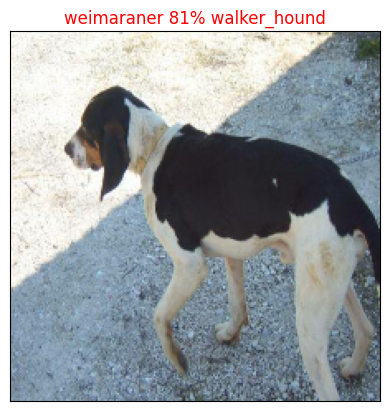

In [ ]:
for i in range(60):
  plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images= val_images,
          n=i)

In [ ]:
len(val_labels)

200

In [ ]:
image(  )

TypeError: ignored